# Measuring photobleaching

In [57]:
import numpy as np
import pandas as pd
import mscl.plotting
import mscl.image
import mscl.mcmc
import skimage.io
import skimage.morphology
import skimage.segmentation
import skimage.filters
import pymc3 as pm
import theano.tensor as tt
import glob
import bokeh.io
import bokeh.plotting
bokeh.io.output_notebook()
root_dir = '../data/images/20171031_photobleaching/'

Loading BokehJS ...

The dilution experiment requires the continued monitoring of the fluorescence throughout several cell divisions. In this notebook, I will try to measure the photobleaching time constant $\tau$ of constitutively expressing cells. 

## Mapping Field Uniformity

While there are still several concerns with respect to even illumination, a first pass at correcting this is to flatten the intensity field given an average image of the illumination profile. This average illumination can be calculated as 

$$
I_\text{flat} = {I_\text{raw} \over I_\text{field}}\langle I_\text{field}\rangle
$$

In [58]:
# Grab all of the fluorescent slide positions -- accidentally have wrong filenames..
slide_pos = glob.glob('{0}fluorescent_slide/*.tif'.format(root_dir))
slide_ims = skimage.io.ImageCollection(slide_pos)

# Average the stack of images without median filtering.
ex_im = slide_ims[3]
avg_field = mscl.image.average_stack(slide_ims)
flat = mscl.image.generate_flatfield(ex_im, avg_field, median_filt=False)

# Show the original, the average, and the flattened
p1 = mscl.plotting.imshow(slide_ims[3], interpixel_distance=0.16,
                         length_units='microns', plot_height=300)
p2 = mscl.plotting.imshow(avg_field, interpixel_distance=0.16,
                         length_units='microns', plot_height=300)
p3 = mscl.plotting.imshow(flat, interpixel_distance=0.16, length_units='microns',
                         plot_height=300)

    
# Allow for linked zooming.
p2.x_range = p1.x_range
p2.y_range = p1.y_range
p3.x_range = p1.x_range
p3.y_range = p1.y_range

# Add labels and show
p1.title.text = 'representative image'
p2.title.text = 'averaged image'
p3.title.text = 'flattened image'
layout = bokeh.layouts.gridplot([[p1, p2, p3]])
bokeh.io.show(layout)

/Users/gchure/anaconda/lib/python3.6/site-packages/skimage/external/tifffile/tifffile.py:1752: UserWarning: ome-xml: not an ome-tiff master file
  warnings.warn("ome-xml: not an ome-tiff master file")


## Measuring photobleaching of autofluorescence

As is described in the testing notebook for the photobleaching heirarchical model, a given bleaching cell would have a bleaching profile of the form

$$
I(t) = \beta + I_0 \exp\left[{-t \over \tau}\right]
$$

where $I_0$ is the initial brightness of the cell at time $t=0$, $\tau$ is bleaching constant, and $\beta$ was a non-bleaching autofluorescence signal. In reality, $\beta$ is an exponential decay in itself of the form

$$
\beta(t) = \beta_0\exp\left[{-t \over \tau_\beta}\right].
$$

This means that the perceived photobleaching of our constitutively expressing strain should therefore be of the form

$$
I(t) = \beta_0\exp\left[{-t \over \tau_\beta}\right] + I_0\exp\left[{-t \over \tau}\right]
$$

which would obviously be a nightmare to fit for a single set. However, I took a few bleaching movies of an autofluorescent sample. By using this, I should be able to put a very informative prior on the autofluorescent decay values. 

###  Segmentation

The first thing I should do is segment the autofluorescence cells in phase and slightly dilate the segmentation mask to negate any small-scale drift in the segmentation.

In [59]:
# Start by loading hte a
auto_files = glob.glob('{0}auto_bleaching/auto_100ms_1/*.tif'.format(root_dir)) 
auto_ims = skimage.io.ImageCollection(auto_files)

# Split in to phase and intensity.
phase = auto_ims[0][:, 0, :, :]
fluo = auto_ims[0][:, 1, :, :]

# Correct the illumination on the fluo stack
fluo_flat = [mscl.image.generate_flatfield(f, avg_field, median_filt=False) for f in fluo]

In [60]:
# Show the images.
p1 = mscl.plotting.imshow(phase[1], interpixel_distance=0.16,
                         length_units='microns', plot_height=300)
p2 = mscl.plotting.imshow(fluo[1], interpixel_distance=0.16,
                         length_units='microns', plot_height=300)
p3 = mscl.plotting.imshow(fluo_flat[1], interpixel_distance=0.16,
                         length_units='microns', plot_height=300)

p1.title.text = 'phase contrast'
p2.title.text = 'GFP'
p3.title.text = 'flattened GFP'
p2.x_range = p1.x_range
p2.y_range = p1.y_range
p3.x_range = p1.x_range
p3.y_range = p1.y_range
layout = bokeh.layouts.gridplot([[p1, p2, p3]])
bokeh.io.show(layout)

For segmentation, we can probaly just get by via thresholding. 

In [61]:
# Flatten the image.
def im_to_float(im): 
    im_float = (im - im.min()) / (im.max() - im.min())
    im_blur = skimage.filters.gaussian(im_float, sigma=5)
    im_sub = im_float - im_blur
    return im_sub

def otsu_thresh(im):
    im_sub = im_to_float(im)
    thresh = skimage.filters.threshold_otsu(im_sub)
    seg = skimage.segmentation.clear_border(im_sub < thresh)
    seg = skimage.morphology.remove_small_objects(seg)
    mask = skimage.measure.label(seg)
    selem = skimage.morphology.disk(2)
    mask = skimage.morphology.dilation(mask, selem) 
    return mask

In [62]:
# Segment the image.
seg_im = otsu_thresh(phase[1])

# Find the boundaries
contours = skimage.measure.find_contours(seg_im > 0, 0)

# Generate the plot.
p1 = mscl.plotting.imshow(np.rot90(phase[1]))
p2 = mscl.plotting.imshow(np.rot90(fluo_flat[-1]))
for c in contours:
    p1.line(c[:, 0], c[:, 1], color='tomato', line_width=2)
    p2.line(c[:, 0], c[:, 1], color='tomato', line_width=2)

p2.x_range = p1.x_range
p2.y_range = p1.y_range
# Layout and show
layout = bokeh.layouts.gridplot([[p1, p2]]) 
bokeh.io.show(layout)

This segmentation scheme seems to be working. Now I can iterate through each fluorescence image and measure the properties. 

In [63]:
import tqdm

In [64]:
auto_df = pd.DataFrame([], columns=['cell_label', 'total_intensity', 'rescaled_intensity', 'area', 'elapsed_time_s'])
EXPOSURE = 0.1
for i, im in enumerate(tqdm.tqdm(fluo_flat)):
    # Segment the corresponding phase image.
    mask = otsu_thresh(phase[i])
    
    # Compute the properties. 
    props = skimage.measure.regionprops(mask, im)
    for j, p in enumerate(props):
        area = p.area * 0.16**2
        intensity = p.mean_intensity * p.area
        label = int(j)
        cell_dict = dict(cell_label=label, total_intensity=intensity,
                        area=area, elapsed_time_s=(i + 1) * EXPOSURE) 
        auto_df = auto_df.append(cell_dict, ignore_index=True)

100%|██████████| 1000/1000 [00:49<00:00, 20.05it/s]


In [65]:
grouped = auto_df.groupby('cell_label')
dfs = []
for g, d in grouped:
    z = d.copy()
    t0  = d.loc[d['elapsed_time_s'] == 0.100]['total_intensity'].values
    d.loc[:, 'rescaled_intensity'] = d.loc[:,'total_intensity'] / t0
    dfs.append(d)
auto_df = pd.concat(dfs, axis=0)

/Users/gchure/anaconda/lib/python3.6/site-packages/pandas/core/indexing.py:601: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item_labels[indexer[info_axis]]] = value


In [66]:
# Plot each trajectory individually.
p1 = mscl.plotting.boilerplate(width=450, height=350, x_axis_label='time [s]',
                             y_axis_label='intensity (a.u.)', title='raw data')
p2 = mscl.plotting.boilerplate(width=450, height=350, x_axis_label='time [s]',
                              y_axis_label='I(t) / I\u2080', title='rescaled data')

# Group the dataframe by cell.
grouped = auto_df.groupby('cell_label')
for g, d in grouped:
    p1.line(d['elapsed_time_s'], d['total_intensity'], color='slategray',
          alpha=0.5)
    
    p2.line(d['elapsed_time_s'], d['rescaled_intensity'],
            color='slategray', alpha=0.5)
layout = bokeh.layouts.gridplot([[p1, p2]])
bokeh.io.show(layout)

These traces look reasonable. Let's go a head and set up an MCMC on each trace individually. 

In [ ]:
# Determine the number of cells.
n_cells = len(auto_df['cell_label'].unique())
with pm.Model() as bi_exp_model: 
    # Set up the priors on each parameter.
    tau = pm.HalfNormal('tau', sd=100, shape=n_cells)
    tau2 = pm.HalfNormal('tau2', sd=100, shape=n_cells)
    beta = pm.HalfFlat('beta', shape=n_cells)
    bg = pm.HalfFlat('bg', shape=n_cells)
    
    # Define the IDs and observables.
    idx = auto_df['cell_label'].values.astype(int)
    obs = auto_df['total_intensity'].values 
    time = auto_df['elapsed_time_s'].values.astype('float')
    
    # Compute the expected value.
    mu = bg[idx] + beta[idx] * (tt.exp(-time / tau[idx]) + tt.exp(-time / tau2[idx]))
     
    # Define the likelihood and sample.
    like = mscl.mcmc.MarginalizedNormal('like', mu=mu, observed=obs) 
    bi_exp_trace = pm.sample(draws=500, tune=500)
    

In [ ]:
_ = pm.traceplot(bi_exp_trace)

In [103]:
# Determine the number of cells.
with pm.Model() as single_exp_model:
    # Set up the priors on each parameter.
    tau = pm.HalfNormal('tau', sd=100, shape=n_cells) 
    bg = pm.HalfFlat('bg', shape=n_cells)
    beta = pm.HalfFlat('beta', shape=n_cells)
    
    # Define the IDs and observables.
    idx = auto_df['cell_label'].values.astype(int)
    obs = auto_df['rescaled_intensity'].values 
    time = auto_df['elapsed_time_s'].values.astype('float')
    
    # Compute the expected value.
    mu = bg[idx] + beta[idx] * tt.exp(-time / tau[idx]) 
     
    # Define the likelihood and sample.
    like = mscl.mcmc.MarginalizedNormal('like', mu=mu, observed=obs) 
    single_exp_trace = pm.sample(draws=500, tune=500, njobs=4)
    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:26<00:00, 37.18it/s]


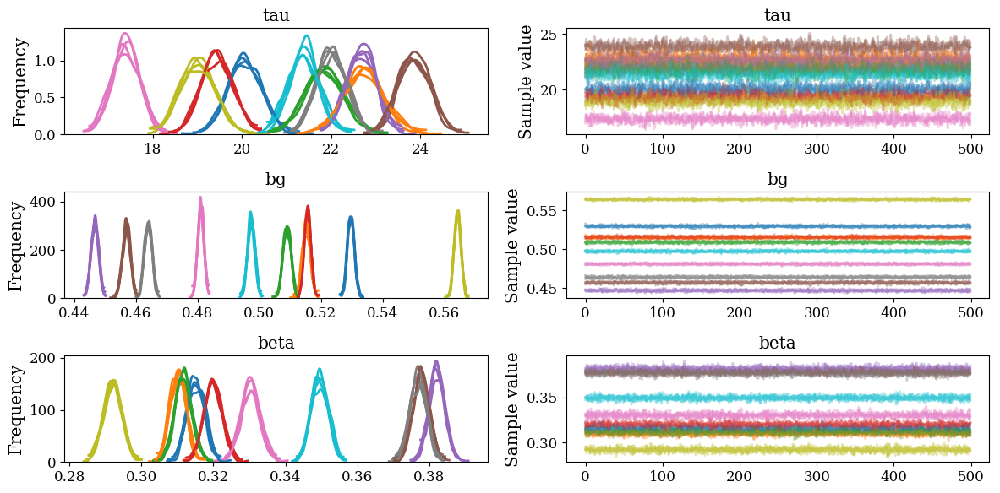

In [104]:
%matplotlib inline
_ = pm.traceplot(single_exp_trace)

In [105]:
single_exp_trace_df = mscl.mcmc.trace_to_dataframe(single_exp_trace, single_exp_model)
# bi_exp_trace_df = mscl.mcmc.trace_to_dataframe(bi_exp_trace, bi_exp_model)
single_exp_stats = mscl.mcmc.compute_statistics(single_exp_trace_df)
# bi_exp_stats = mscl.mcmc.compute_statistics(bi_exp_trace_df)

In [106]:
# Plot the fits. 
canvases = [[], [], [], []]
grouped = auto_df.groupby(['cell_label'])
time_range = np.linspace(0, 100, 1000)
canvas_ind = 0
for g, d in grouped:
    p = mscl.plotting.boilerplate(width=300, height=300)
    p.circle(d['elapsed_time_s'], d['rescaled_intensity'], color='slategray', alpha=0.4)
    
    # Extract the stats
    single_bg = single_exp_stats.loc[single_exp_stats['parameter']=='bg__{0}'.format(int(g))]['mode'].values
#     bi_bg = bi_exp_stats.loc[bi_exp_stats['parameter']=='bg__{0}'.format(int(g))]['mode'].values
    single_beta = single_exp_stats.loc[single_exp_stats['parameter']=='beta__{0}'.format(int(g))]['mode'].values
#     bi_beta = bi_exp_stats.loc[bi_exp_stats['parameter']=='beta__{0}'.format(int(g))]['mode'].values
    single_tau = single_exp_stats.loc[single_exp_stats['parameter']=='tau__{0}'.format(int(g))]['mode'].values
#     bi_tau = bi_exp_stats.loc[bi_exp_stats['parameter']=='tau__{0}'.format(int(g))]['mode'].values
#     bi_tau2 = bi_exp_stats.loc[bi_exp_stats['parameter']=='tau2__{0}'.format(int(g))]['mode'].values
#     
    single_theo = single_bg + single_beta * np.exp(-time_range / single_tau)
#     bi_theo = bi_bg + bi_beta * (np.exp(-time_range / bi_tau) + np.exp(-time_range / bi_tau2))
    p.line(time_range, single_theo, color='dodgerblue', line_width=2, legend='single exp. model')
#     p.line(time_range, bi_theo, color='tomato', line_width=2, legend='biexponential model')
    p.title.text = 'cell {0}'.format(g)
    
    if (g + 1) %3 != 0:
        canvases[canvas_ind].append(p)
    
    else:
        canvases[canvas_ind].append(p)
        canvas_ind += 1   

layout = bokeh.layouts.gridplot(canvases)
bokeh.io.show(layout) 

In [68]:
pm.compare((single_exp_trace, bi_exp_trace), (single_exp_model, bi_exp_model))

,WAIC,pWAIC,dWAIC,weight,SE,dSE,warning
0,50226.6,16.58,0,NaN,0,0,1
1,70720,910.57,20493.4,NaN,0,0,1


### Heirarchical model 

In [107]:
with pm.Model() as heriarch_model:
    # Define the hyperpriors
    tau0_mu = pm.HalfFlat('tau0_mu')
    tau0_sig = pm.HalfNormal('tau0_sig', sd=100)  

    bg_mu = pm.Uniform('bg_mu', lower=0, upper=1)
    bg_sig = mscl.mcmc.Jeffreys('bg_sig', lower=1E-2, upper=1)
    beta_mu = pm.Uniform('beta_mu', lower=0, upper=1)
    beta_sig = mscl.mcmc.Jeffreys('beta_sig', lower=1E-2, upper=1)
    
    # Define the low-level priors.
    tau = mscl.mcmc.ReparameterizedNormal('tau', mu=tau0_mu, sd=tau0_sig, shape=n_cells)
    bg = mscl.mcmc.ReparameterizedNormal('bg', mu=bg_mu, sd=bg_sig, shape=n_cells)
    beta = mscl.mcmc.ReparameterizedNormal('beta', mu=beta_mu, sd=beta_sig, shape=n_cells)
    
    # Compute the indices.
    idx = auto_df['cell_label'].values.astype(int)
    obs = auto_df['rescaled_intensity'].values.astype(float)
    time = auto_df['elapsed_time_s'].values.astype(float)
    
    # Compute the expectation.
    theo = bg[idx] + beta[idx] * (tt.exp(-time / tau[idx]))
    
    # Define the likelihood and sample.
    like = mscl.mcmc.MarginalizedNormal('like', mu=theo, observed=obs) 
    trace = pm.sample(draws=400, tune=400, njobs=6)
    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 800/800 [13:16<00:00,  1.00it/s]/Users/gchure/anaconda/lib/python3.6/site-packages/pymc3/step_methods/hmc/nuts.py:429: UserWarning: Chain 0 contains only 400 samples.
  % (self._chain_id, n))
/Users/gchure/anaconda/lib/python3.6/site-packages/pymc3/step_methods/hmc/nuts.py:459: UserWarning: Chain 0 reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
  'reparameterize.' % self._chain_id)

/Users/gchure/anaconda/lib/python3.6/site-packages/pymc3/step_methods/hmc/nuts.py:429: UserWarning: Chain 5 contains only 400 samples.
  % (self._chain_id, n))
/Users/gchure/anaconda/lib/python3.6/site-packages/pymc3/step_methods/hmc/nuts.py:459: UserWarning: Chain 5 reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
  'reparameterize.' % self._chain_id)
/Users/gchure/anaconda/lib/python3.6/site-packages/pymc3/step_meth

In [109]:
_ = mscl.plotting.traceplot(trace, varnames=['tau0_mu', 'beta_mu', 'bg_mu'], dist_type='kde')

In [91]:
# Plot the fits. 
canvases = [[], [], [], []]
grouped = auto_df.groupby(['cell_label'])
time_range = np.linspace(0, 100, 1000)
canvas_ind = 0
tau_mu = stats.loc[stats['parameter']=='tau0_mu']['mode'].values
bg_mu = stats.loc[stats['parameter']=='bg_mu']['mode'].values
beta_mu = stats.loc[stats['parameter']=='beta_mu']['mode'].values
for g, d in grouped:
    p = mscl.plotting.boilerplate(width=300, height=300)
    p.circle(d['elapsed_time_s'], d['rescaled_intensity'], color='slategray', alpha=0.4)
    
    # Extract the stats
    beta = stats.loc[stats['parameter']=='beta0__{0}'.format(int(g))]['mode'].values
    
    theo = bg_mu + beta_mu *  np.exp(-time_range / tau_mu)
    p.line(time_range, theo, color='dodgerblue', line_width=2)
    p.title.text = 'cell {0}'.format(g)
    
    if (g + 1) %3 != 0:
        canvases[canvas_ind].append(p)
    
    else:
        canvases[canvas_ind].append(p)
        canvas_ind += 1   

layout = bokeh.layouts.gridplot(canvases)
bokeh.io.show(layout) 